# Particles Visualization 

In [1]:
# Import the first libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline

In [2]:
sns.set(context="notebook", font='serif', palette='Set1')

In [3]:
# Download and visualize the dataframe
detectors = pd.read_csv('./detectors.zip')
detectors.head()

,volume_id,layer_id,module_id,cx,cy,cz,rot_xu,rot_xv,rot_xw,rot_yu,...,rot_yw,rot_zu,rot_zv,rot_zw,module_t,module_minhu,module_maxhu,module_hv,pitch_u,pitch_v
0,7,2,1,-65.7965,-5.17830,-1502.5,0.078459,-0.996917,0.0,-0.996917,...,0.0,0,0,-1,0.15,8.4,8.4,36,0.05,0.05625
1,7,2,2,-139.8510,-6.46568,-1502.0,0.046183,-0.998933,0.0,-0.998933,...,0.0,0,0,-1,0.15,8.4,8.4,36,0.05,0.05625
2,7,2,3,-138.6570,-19.34190,-1498.0,0.138156,-0.990410,0.0,-0.990410,...,0.0,0,0,-1,0.15,8.4,8.4,36,0.05,0.05625
3,7,2,4,-64.1764,-15.40740,-1498.0,0.233445,-0.972370,0.0,-0.972370,...,0.0,0,0,-1,0.15,8.4,8.4,36,0.05,0.05625
4,7,2,5,-136.2810,-32.05310,-1502.0,0.228951,-0.973438,0.0,-0.973438,...,0.0,0,0,-1,0.15,8.4,8.4,36,0.05,0.05625


### General information on the detector's data set :

The detector is built from silicon slabs (or modules, rectangular or trapezoïdal), arranged in cylinders and disks, which measure the position (or hits) of the particles  that cross them. The detector modules are organized into detector groups or volumes  identified by a volume id. Inside a volume they are further grouped into layers identified by a layer id. Each layer can contain an arbitrary number of detector modules, the smallest geometrically distinct detector object, each identified by a module_id. Within each group, detector modules are of the same type have e.g. the same granularity. All simulated detector modules are so-called semiconductor sensors that are build from  thin silicon sensor chips. Each module can be represented by a two-dimensional, planar,  bounded sensitive surface. These sensitive surfaces are subdivided into regular grids that  define the detectors cells, the smallest granularity within the detector.

#### Columns:
- volume_id: numerical identifier of the detector group.
- layer_id: numerical identifier of the detector layer inside the group.
- module_id: numerical identifier of the detector module inside the layer.
- cx, cy, cz: position of the local origin in the described in the global coordinate system (in millimeter).
- rot_xu, rot_xv, rot_xw, rot_yu, ...: components of the rotation matrix to rotate from local u,v,w to global x,y,z coordinates.
- module_t: half thickness of the detector module (in millimeter).
- module_minhu, module_maxhu: the minimum/maximum half-length of the module boundary along the local u direction (in millimeter).
- module_hv: the half-length of the module boundary along the local v direction (in millimeter).
- pitch_u, pitch_v: the size of detector cells along the local u and v direction (in millimeter).

In [4]:
# Obtain the general information about data type and null characters:
detectors.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18728 entries, 0 to 18727
Data columns (total 21 columns):
volume_id       18728 non-null int64
layer_id        18728 non-null int64
module_id       18728 non-null int64
cx              18728 non-null float64
cy              18728 non-null float64
cz              18728 non-null float64
rot_xu          18728 non-null float64
rot_xv          18728 non-null float64
rot_xw          18728 non-null float64
rot_yu          18728 non-null float64
rot_yv          18728 non-null float64
rot_yw          18728 non-null float64
rot_zu          18728 non-null int64
rot_zv          18728 non-null int64
rot_zw          18728 non-null int64
module_t        18728 non-null float64
module_minhu    18728 non-null float64
module_maxhu    18728 non-null float64
module_hv       18728 non-null int64
pitch_u         18728 non-null float64
pitch_v         18728 non-null float64
dtypes: float64(14), int64(7)
memory usage: 3.0 MB


In [5]:
# General statistical description of the data
detectors.describe().T

,count,mean,std,min,25%,50%,75%,max
volume_id,18728.0,1.340218e+01,3.364657,7.000000,12.000000,1.300000e+01,17.000000,18.000000
layer_id,18728.0,5.398761e+00,2.865323,2.000000,4.000000,4.000000e+00,8.000000,14.000000
module_id,18728.0,7.613319e+02,781.609114,1.000000,98.000000,4.960000e+02,1203.000000,3192.000000
cx,18728.0,-9.712673e-17,463.719439,-1021.280000,-299.470000,3.052430e-14,299.470000,1021.280000
cy,18728.0,-7.770138e-16,463.719432,-1021.280000,-294.825000,0.000000e+00,294.825000,1021.280000
cz,18728.0,0.000000e+00,1050.729994,-2955.500000,-618.000000,0.000000e+00,618.000000,2955.500000
rot_xu,18728.0,1.517605e-18,0.707126,-1.000000,-0.707107,0.000000e+00,0.707107,1.000000
rot_xv,18728.0,-1.422755e-19,0.355295,-0.998933,0.000000,0.000000e+00,0.000000,0.998933
rot_xw,18728.0,8.536529e-19,0.611385,-0.999992,-0.503460,0.000000e+00,0.503460,0.999992
rot_yu,18728.0,1.233054e-18,0.707126,-0.999992,-0.707107,0.000000e+00,0.707107,0.999992


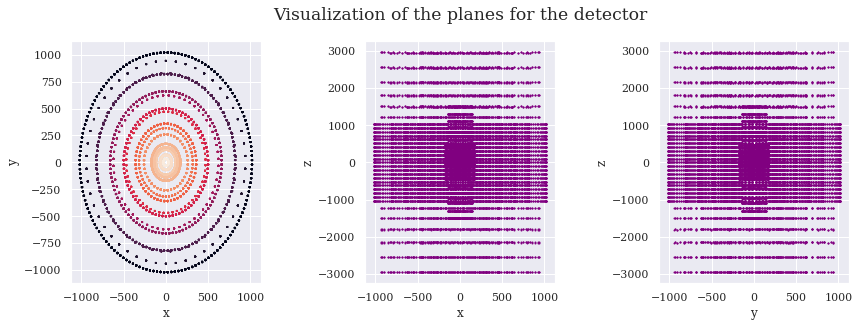

In [6]:
# Plot the view of the detectors in different planes
fig = plt.figure(figsize=(12,8))
st = fig.suptitle('Visualization of the planes for the detector', fontsize='x-large')

#x-y
plt.subplot(131)
plt.scatter(detectors.cx,detectors.cy, s=1, c=1-np.sqrt(detectors.cx**2+detectors.cy**2))
plt.xlabel('x')
plt.ylabel('y')

#x-z
plt.subplot(132)
plt.scatter(detectors.cx,detectors.cz, s=1,color='purple')
plt.xlabel('x')
plt.ylabel('z')

#y-z
plt.subplot(133)
plt.scatter(detectors.cy,detectors.cz, s=1, color='purple')
plt.xlabel('y')
plt.ylabel('z')

plt.subplots_adjust(top=0.92, bottom=0.5, left=0.05, right=0.95, hspace=0.25, wspace=0.55)
plt.show()

We can see that on the x-y plane the detector looks circular (top view), on the x-z (front view) and y-z plane (side view)  it looks rectangular, therefore it is safe to assume that it is a cylindrical detector.

In [7]:
# Plot the dimensions of the detectors
fig = px.scatter_3d(detectors, x='cx', y='cy', z='cz', color = 'layer_id', size_max=.01)
fig.update_layout(margin=dict(l=100, r=0, b=0, t=0))
fig.show()

3D plot of the detector
![3D plot of the detector](./pictures/image1.png)

By plotting the 3-D array it is possible to determine that, in fact, the detector has a cylinder shape. 

In [8]:
# Rotation transformation on the original coordinates to see the general coordinates
detectors['cu'] = detectors.cx*detectors.rot_xu + detectors.cy*detectors.rot_xv + detectors.cz*detectors.rot_xw
detectors['cv'] = detectors.cx*detectors.rot_yu + detectors.cy*detectors.rot_yv + detectors.cz*detectors.rot_yw
detectors['cw'] = detectors.cx*detectors.rot_zu + detectors.cy*detectors.rot_zv + detectors.cz*detectors.rot_zw

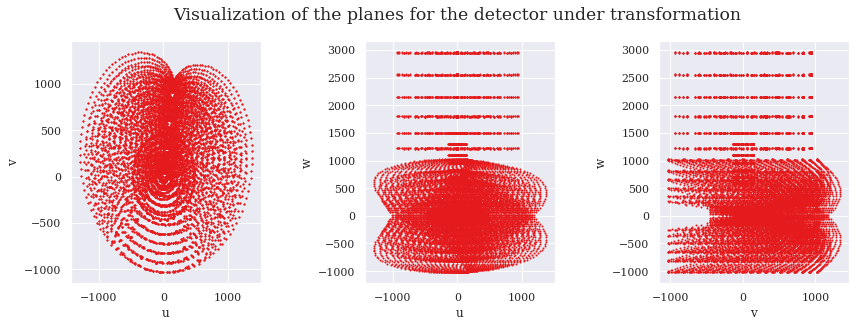

In [9]:
# Graph of the rotated transformations on each plane
fig = plt.figure(figsize=(12,8))
st = fig.suptitle("Visualization of the planes for the detector under transformation ", fontsize="x-large")

# u-v
plt.subplot(131)
plt.scatter(detectors.cu,detectors.cv, s=1)
plt.xlabel('u')
plt.ylabel('v')

# u-w
plt.subplot(132)
plt.scatter(detectors.cu,detectors.cw, s=1)
plt.xlabel('u')
plt.ylabel('w')

# v-w
plt.subplot(133)
plt.scatter(detectors.cv,detectors.cw, s=1)
plt.xlabel('v')
plt.ylabel('w')

plt.subplots_adjust(top=0.92, bottom=0.5, left=0.05, right=0.95, hspace=0.25, wspace=0.55)
plt.show()

There were some transformations that could be appied on each of the elements. When applied, the form of the detector changed. The x-y view was transformed into u-v, and therefore the whole shape of the detector was.
as viewed from the front one can tell that the cylinder shape transformed into a non regular shape where at the bottom it was possible to see a strange patter.
The planes u-w (front) and v-w (side) shows a new form.

In [10]:
# 3d representation of the now rotated image
fig = px.scatter_3d(detectors, x='cu', y='cv', z='cw', color = 'layer_id', size_max=.01)
fig.update_layout(margin=dict(l=100, r=0, b=0, t=0))
fig.show()

3D plot of the transformed detector
![3D plot of the transformed detector](./pictures/image2.png)

Likewise, the 3-D plot of this new figure was determined, for a better appreciation.

Text(0.5, 1.0, 'Area of the detectors')

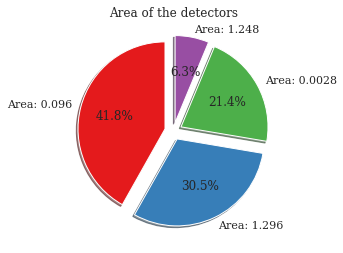

In [11]:
# Each point can be interpreted as a detector, they both have a definite area, therefore we can determine it. 

detectors['area'] = detectors['pitch_u']*detectors['pitch_v']
area = detectors['area'].value_counts()
label=[f'Area: {(round(name,4))}' for name in area.index]
plt.pie(area, labels=label, startangle=90, shadow=True, autopct='%1.1f%%', labeldistance = 1.1, explode=(.1, 0.1, .1, .1))
plt.title('Area of the detectors')

Some parameters of the detectors were given in these coordinates, therefore another parameter was done by multiplying each of these values. This will account for an 'area'. 
The distribution of percentages is seen on each detector. There were more detectors with an Area of 0.096, representing a 41.8%.

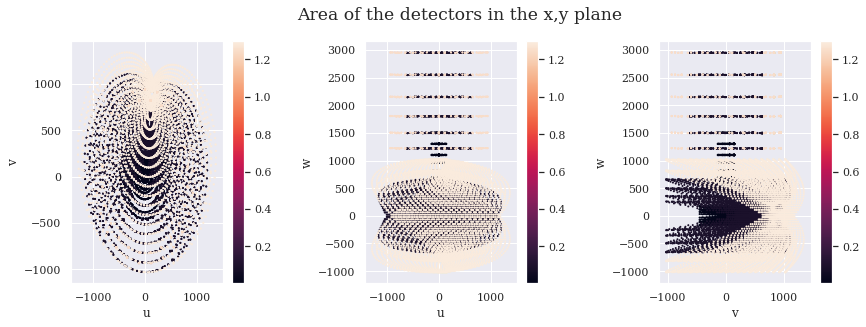

In [12]:
# The area is obtained in new coordinates,
# therefore we can assign a value of color 
# to the coordinates of the area to appreciate
# how it changes along the u and v axis


# Graph of the rotated transformations on each plane
fig = plt.figure(figsize=(12,8))
st = fig.suptitle('Area of the detectors in the x,y plane', fontsize="x-large")

#
plt.subplot(131)
plt.scatter(detectors.cu,detectors.cv, s=1, c=detectors.area)
plt.xlabel('u')
plt.ylabel('v')
plt.colorbar()

plt.subplot(132)
plt.scatter(detectors.cu,detectors.cw, s=1, c=detectors.area)
plt.xlabel('u')
plt.ylabel('w')
plt.colorbar()

plt.subplot(133)
plt.scatter(detectors.cv,detectors.cw, s=1, c=detectors.area)
plt.xlabel('v')
plt.ylabel('w')
plt.colorbar()

plt.subplots_adjust(top=0.92, bottom=0.5, left=0.05, right=0.95, hspace=0.25, wspace=0.55)
plt.show()

As we can see, the area is a parameter of the plot, therefore we can assign each detector with an area. It seems that they do not depend on the radius. but in the outer layers of the detector chamber: The biggest detectors are in the outher shells.

In [13]:
# Area 3d representation
fig = px.scatter_3d(detectors, x='cu', y='cv', z='cw', color = 'area', size_max=.01)
fig.update_layout(margin=dict(l=100, r=0, b=0, t=0))
fig.show()

3D plot of the transformed detector
![3D plot of the transformed detector](./pictures/image3.png)

## Particles

The particles files contains the following values for each particle/entry:

- particle_id: numerical identifier of the particle inside the event.
- vx, vy, vz: initial position or vertex (in millimeters) in global coordinates.
- px, py, pz: initial momentum (in GeV/c) along each global axis.
- q: particle charge (as multiple of the absolute electron charge).
- nhits: number of hits generated by this particle.

In [14]:
particles01 = pd.read_csv('./train_1/train_1/event000001000-particles.csv')
particles01.head()

,particle_id,vx,vy,vz,px,py,pz,q,nhits
0,4503668346847232,-0.009288,0.009861,-0.077879,-0.055269,0.323272,-0.203492,-1,8
1,4503737066323968,-0.009288,0.009861,-0.077879,-0.948125,0.470892,2.010060,1,11
2,4503805785800704,-0.009288,0.009861,-0.077879,-0.886484,0.105749,0.683881,-1,0
3,4503874505277440,-0.009288,0.009861,-0.077879,0.257539,-0.676718,0.991616,1,12
4,4503943224754176,-0.009288,0.009861,-0.077879,16.439400,-15.548900,-39.824900,1,3


In [15]:
# Description of the particle dataset
particles01.describe()

,particle_id,vx,vy,vz,px,py,pz,q,nhits
count,1.226300e+04,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000
mean,4.803273e+17,1.107652,0.767732,7.498848,-0.003691,0.000103,0.100067,0.107233,8.424121
std,2.983347e+17,124.103059,124.627595,537.857006,0.930213,0.640033,7.765764,0.994274,5.033464
min,4.503668e+15,-955.514000,-901.665000,-2955.500000,-45.300700,-16.516300,-95.573400,-1.000000,0.000000
25%,2.161771e+17,-0.017552,-0.013040,-5.444660,-0.215898,-0.208301,-0.815998,-1.000000,4.000000
50%,4.548682e+17,0.000457,0.002574,-0.438758,-0.005679,0.006612,0.001188,1.000000,10.000000
75%,7.431018e+17,0.014919,0.013532,6.016730,0.203908,0.215444,0.848551,1.000000,12.000000
max,9.683079e+17,968.200000,980.807000,2950.000000,53.201600,11.169400,459.528000,1.000000,19.000000


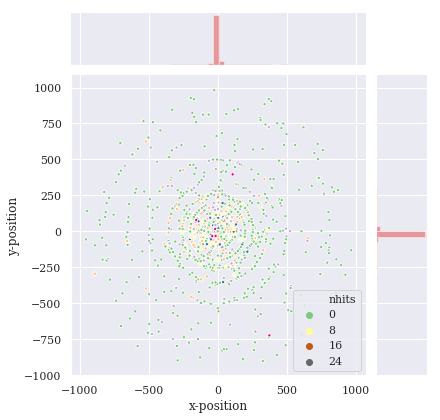

In [16]:
# A plot of the position and the distribution of the particles in
# plane x and y for the initial position is done.

x_y = sns.jointplot(particles01.vx,particles01.vy, s=10 )
x_y.ax_joint.cla()
plt.sca(x_y .ax_joint)
sns.scatterplot(particles01.vx, particles01.vy, hue=particles01.nhits, s=10, palette='Accent')
plt.xlabel('x-position')
plt.ylabel('y-position')
plt.show()

Most of the particles start in the centered position on the x-y plane. Actually the distribution graph is really concentrated in that point.

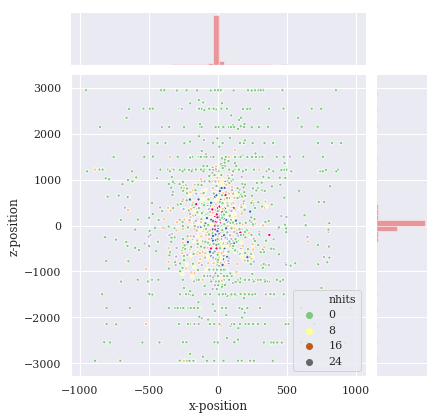

In [17]:
# A plot of the position and the distribution of the particles in
# plane z and x for the initial position is done.

x_z = sns.jointplot(particles01.vx,particles01.vz, s=10 )
x_z.ax_joint.cla()
plt.sca(x_z .ax_joint)
sns.scatterplot(particles01.vx, particles01.vz, hue=particles01.nhits, s=10, palette='Accent')
plt.xlabel('x-position')
plt.ylabel('z-position')
plt.show()

In the front view (x-z) there is some spreading, but the same principle is still seen: most of them start at the center position. 

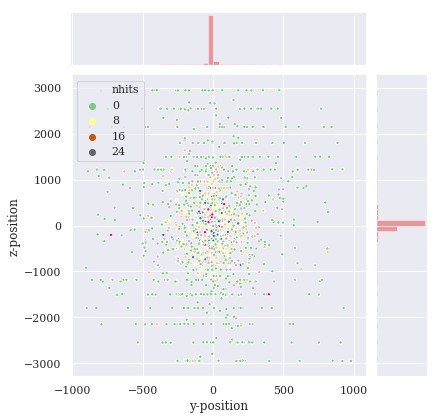

In [18]:
# A plot of the position and the distribution of the particles in
# plane z and y for the initial position is done.

y_z = sns.jointplot(particles01.vy,particles01.vz, s=10 )
y_z.ax_joint.cla()
plt.sca(y_z .ax_joint)
sns.scatterplot(particles01.vy, particles01.vz, hue=particles01.nhits,  s=10, palette='Accent')
plt.xlabel('y-position')
plt.ylabel('z-position')
plt.show()

Not a suprise to see that in the side view (y-z) we find the same behavior.

In [19]:
# 3D visualization of the initial position 
fig = px.scatter_3d(particles01, x='vx', y='vy', z='vz', color = 'nhits', size_max=.01)
fig.show()

3D visualization of the initial position
![3D visualization of the initial position](./pictures/image4.png)

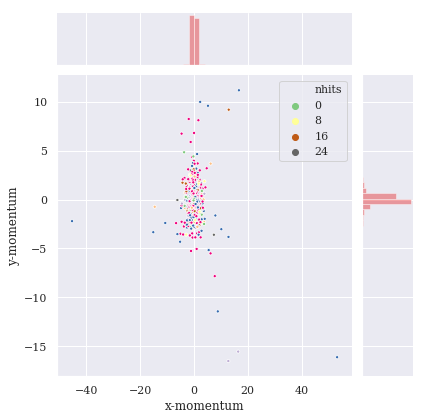

In [20]:
# A plot of the momentum and the distribution of the particles in the momentum
# plane x and y for the initial position is done.

x_y = sns.jointplot(particles01.px,particles01.py, s=10 )
x_y.ax_joint.cla()
plt.sca(x_y .ax_joint)
sns.scatterplot(particles01.px, particles01.py, hue=particles01.nhits, s=10, palette='Accent')
plt.xlabel('x-momentum')
plt.ylabel('y-momentum')
plt.show()

In the momentum space, it is possible to determine that most of the particles have no momentum in x, however, there is a larger distribution on the y spreading. Nevertheless, almost all particles start with a low momentum being 0,0 the most common. 

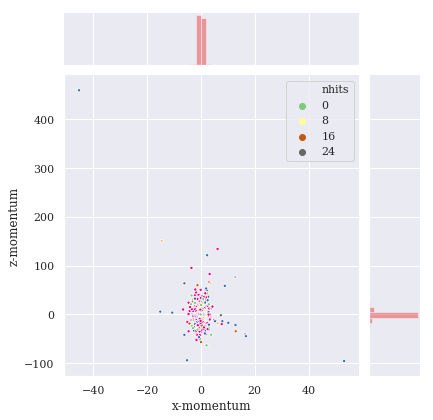

In [21]:
# A plot of the momentum and the distribution of the particles in the momentum
# plane x and z for the initial position is done.

x_z = sns.jointplot(particles01.px,particles01.pz, s=10 )
x_z.ax_joint.cla()
plt.sca(x_z .ax_joint)
sns.scatterplot(particles01.px, particles01.pz, hue=particles01.nhits, s=10, palette='Accent')
plt.xlabel('x-momentum')
plt.ylabel('z-momentum')
plt.show()

The same is seen for the other coordinates, where most is concentrated at the origin. There are some outliers that might get checked.

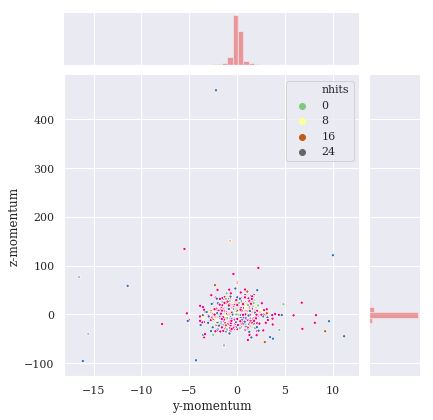

In [22]:
# A plot of the momentum and the distribution of the particles in the momentum
# plane x and y for the initial position is done.

y_z = sns.jointplot(particles01.py,particles01.pz, s=10 )
y_z.ax_joint.cla()
plt.sca(y_z .ax_joint)
sns.scatterplot(particles01.py, particles01.pz, hue=particles01.nhits, s=10, palette='Accent')
plt.xlabel('y-momentum')
plt.ylabel('z-momentum')
plt.show()

In this sideview, the same is measured, however these points are more concentrated.

In [23]:
# 3D visualization of the initial momentum (this is not that impressive)
fig = px.scatter_3d(particles01, x='px', y='py', z='pz', color = 'nhits', size_max=.01)
fig.show()

3D visualization of the initial momentum
![3D visualization of the initial momentum](./pictures/image5.png)

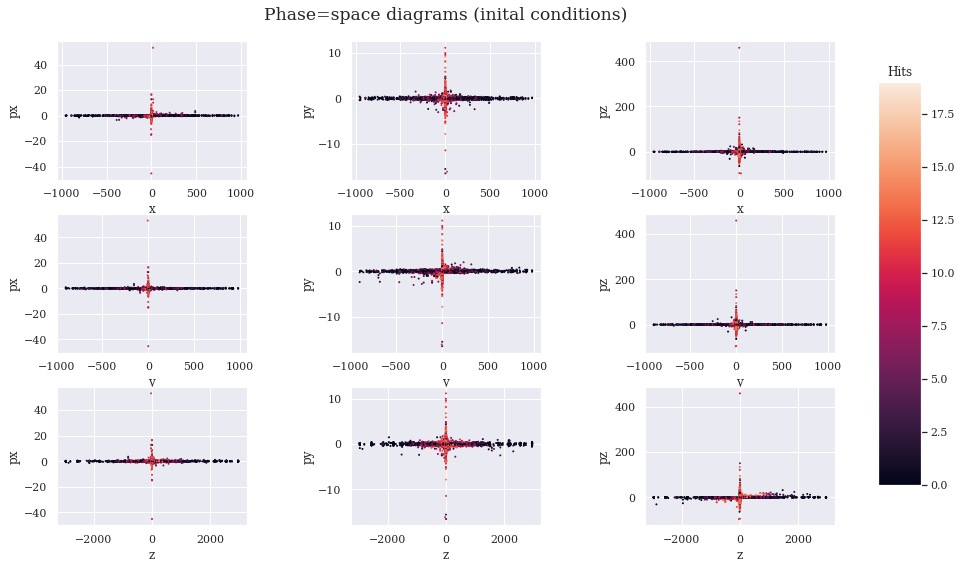

In [24]:
# Phase-space diagrams for each position and each momentum individually

fig = plt.figure(figsize=(12,8))
st = fig.suptitle("Phase=space diagrams (inital conditions)", fontsize="x-large")

plt.subplot(331)
plt.scatter(particles01.vx,particles01.px, s=1, c=particles01.nhits)
plt.xlabel('x')
plt.ylabel('px')

plt.subplot(332)
plt.scatter(particles01.vx,particles01.py, s=1, c=particles01.nhits)
plt.xlabel('x')
plt.ylabel('py')

plt.subplot(333)
plt.scatter(particles01.vx,particles01.pz, s=1, c=particles01.nhits)
plt.xlabel('x')
plt.ylabel('pz')

plt.subplot(334)
plt.scatter(particles01.vy,particles01.px, s=1, c=particles01.nhits)
plt.xlabel('y')
plt.ylabel('px')

plt.subplot(335)
plt.scatter(particles01.vy,particles01.py, s=1, c=particles01.nhits)
plt.xlabel('y')
plt.ylabel('py')

plt.subplot(336)
plt.scatter(particles01.vy,particles01.pz, s=1, c=particles01.nhits)
plt.xlabel('y')
plt.ylabel('pz')

plt.subplot(337)
plt.scatter(particles01.vz,particles01.px, s=1, c=particles01.nhits)
plt.xlabel('z')
plt.ylabel('px')

plt.subplot(338)
plt.scatter(particles01.vz,particles01.py, s=1, c=particles01.nhits)
plt.xlabel('z')
plt.ylabel('py')

plt.subplot(339)
plt.scatter(particles01.vz,particles01.pz, s=1, c=particles01.nhits)
plt.xlabel('z')
plt.ylabel('pz')

cbar_ax = fig.add_axes([1, 0.15, 0.05, 0.7])
fig.colorbar(plt.scatter(particles01.vz,particles01.pz, s=1, c=particles01.nhits),cax=cbar_ax)
plt.title('Hits')

plt.subplots_adjust(top=0.92, bottom=0.08, left=0.05, right=0.95, hspace=0.25, wspace=0.55)


plt.show()

Phase-space diagrams are an important factor to analyze in physics, in this case we can see that for most particles, if they are not located on the center position, their momentum will not be large. It is also seen that the more momentum they had, the more hits were done. 

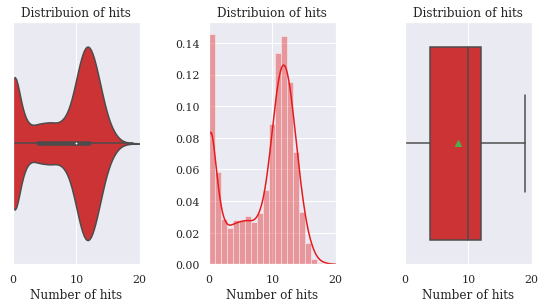

In [25]:
# Distribution of hits with values

plt.figure(figsize=(8,8))

# Creation of subplots

plt.subplot(131)
# Violin graph
sns.violinplot(particles01.nhits)
plt.title('Distribuion of hits')
plt.xlabel('Number of hits')
plt.xlim(0,20)

plt.subplot(132)
# Histogram graph
sns.distplot(particles01.nhits, bins=20)
plt.title('Distribuion of hits')
plt.xlabel('Number of hits')
plt.xlim(0,20)

plt.subplot(133)
# Box graph
sns.boxplot(particles01.nhits, showmeans=True)
plt.title('Distribuion of hits')
plt.xlabel('Number of hits')
plt.xlim(0,20)

#Adjustment of parameters
plt.subplots_adjust(top=0.5, bottom=0.08, left=0.05, right=0.95, hspace=0.25, wspace=0.55)
plt.show()

Many particles did not get any hit; however, there was a large quantity that managed to obtain hits in a range of 10 to 20. The average number of hits was about 9.

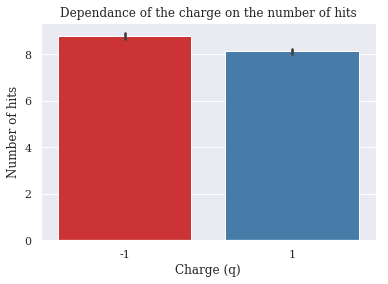

In [26]:
# A bar chart is generated to determine if there is a relation between the
# number of hits and the charge.
sns.barplot(particles01['q'],particles01['nhits'])
plt.xlabel('Charge (q)')
plt.ylabel('Number of hits')
plt.title('Dependance of the charge on the number of hits')
plt.show()

It seems there is no significant difference on the number of hits done and the amount of charge present.

## HITS:
- hit_id: numerical identifier of the hit inside the event.
- x, y, z: measured x, y, z position (in millimeter) of the hit in global coordinates.
- volume_id: numerical identifier of the detector group.
- layer_id: numerical identifier of the detector layer inside the group.
- module_id: numerical identifier of the detector module inside the layer.
    
The volume/layer/module id could in principle be deduced from x, y, z. They are given here to simplify detector-specific data handling.

In [27]:
hits01 = pd.read_csv('./train_1/train_1/event000001000-hits.csv')
hits01.head()

,hit_id,x,y,z,volume_id,layer_id,module_id
0,1,-64.4099,-7.163700,-1502.5,7,2,1
1,2,-55.3361,0.635342,-1502.5,7,2,1
2,3,-83.8305,-1.143010,-1502.5,7,2,1
3,4,-96.1091,-8.241030,-1502.5,7,2,1
4,5,-62.6736,-9.371200,-1502.5,7,2,1


In [28]:
hits01.describe().T

,count,mean,std,min,25%,50%,75%,max
hit_id,120939.0,60470.000000,34912.226440,1.00,30235.5000,60470.00000,90704.50000,120939.00
x,120939.0,-1.769455,305.715117,-1024.84,-100.1460,-1.65134,97.26765,1025.33
y,120939.0,4.751040,305.173087,-1025.11,-95.8965,1.00592,103.22400,1024.85
z,120939.0,-2.315079,1061.912453,-2955.50,-655.8000,-1.80000,655.80000,2955.50
volume_id,120939.0,10.921564,3.365705,7.00,8.0000,9.00000,13.00000,18.00
layer_id,120939.0,5.918389,3.407428,2.00,4.0000,6.00000,8.00000,14.00
module_id,120939.0,371.969117,529.032206,1.00,60.0000,119.00000,490.00000,3192.00


## Cells

The cells file contains the constituent active detector cells that comprise each hit. The cells can be used to refine the hit to track association. A cell is the smallest granularity inside each detector module, much like a pixel on a screen, except that depending on the volume_id a cell can be a square or a long rectangle. It is identified by two channel identifiers that are unique within each detector module and encode the position, much like column/row numbers of a matrix. A cell can provide signal information that the detector module has recorded in addition to the position. Depending on the detector type only one of the channel identifiers is valid, e.g. for the strip detectors, and the value might have different resolution.

- hit_id: numerical identifier of the hit as defined in the hits file.
- ch0, ch1: channel identifier/coordinates unique within one module.
- value: signal value information, e.g. how much charge a particle has deposited.

In [29]:
# Obtain the dataset and visualize it
cells01 = pd.read_csv('./train_1/train_1/event000001000-cells.csv')
cells01.head()

,hit_id,ch0,ch1,value
0,1,209,617,0.013832
1,1,210,617,0.079887
2,1,209,618,0.211723
3,2,68,446,0.334087
4,3,58,954,0.034005


In [30]:
cells01.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 664996 entries, 0 to 664995
Data columns (total 4 columns):
hit_id    664996 non-null int64
ch0       664996 non-null int64
ch1       664996 non-null int64
value     664996 non-null float64
dtypes: float64(1), int64(3)
memory usage: 20.3 MB


In [31]:
cells01.describe()

,hit_id,ch0,ch1,value
count,664996.000000,664996.000000,664996.000000,6.649960e+05
mean,49603.957174,211.529248,444.395715,3.560307e-01
std,32415.296519,156.399517,411.081790,4.324582e-01
min,1.000000,0.000000,0.000000,1.461840e-07
25%,25174.000000,97.000000,55.000000,5.364858e-02
50%,36148.000000,191.000000,340.000000,6.512935e-02
75%,78196.000000,287.000000,802.000000,1.000000e+00
max,120939.000000,1195.000000,1279.000000,1.000000e+00


In [32]:
cells01.groupby('hit_id').mean().info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 120939 entries, 1 to 120939
Data columns (total 3 columns):
ch0      120939 non-null float64
ch1      120939 non-null float64
value    120939 non-null float64
dtypes: float64(3)
memory usage: 3.7 MB


## Truth 

The truth file contains the mapping between hits and generating particles and the true particle state at each measured hit. Each entry maps one hit to one particle.

- hit_id: numerical identifier of the hit as defined in the hits file.
- particle_id: numerical identifier of the generating particle as defined in the particles file. A value of 0 means that the hit did not originate from a reconstructible particle, but e.g. from detector noise.
- tx, ty, tz true intersection point in global coordinates (in millimeters) between the particle trajectory and the sensitive surface.
- tpx, tpy, tpz true particle momentum (in GeV/c) in the global coordinate system at the intersection point. The corresponding vector is tangent to the particle trajectory at the intersection point.
- weight per-hit weight used for the scoring metric; total sum of weights within one event equals to one.

In [33]:
truth01 = pd.read_csv('./train_1/train_1/event000001000-truth.csv')
truth01.head()

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight
0,1,0,-64.4116,-7.164120,-1502.5,250710.000000,-149908.000000,-956385.00000,0.000000
1,2,22525763437723648,-55.3385,0.630805,-1502.5,-0.570605,0.028390,-15.49220,0.000010
2,3,0,-83.8280,-1.145580,-1502.5,626295.000000,-169767.000000,-760877.00000,0.000000
3,4,297237712845406208,-96.1229,-8.230360,-1502.5,-0.225235,-0.050968,-3.70232,0.000008
4,5,418835796137607168,-62.6594,-9.375040,-1502.5,-0.281806,-0.023487,-6.57318,0.000009


In [34]:
truth01.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120939 entries, 0 to 120938
Data columns (total 9 columns):
hit_id         120939 non-null int64
particle_id    120939 non-null int64
tx             120939 non-null float64
ty             120939 non-null float64
tz             120939 non-null float64
tpx            120939 non-null float64
tpy            120939 non-null float64
tpz            120939 non-null float64
weight         120939 non-null float64
dtypes: float64(7), int64(2)
memory usage: 8.3 MB


In [35]:
truth01.describe()

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight
count,120939.00000,1.209390e+05,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000
mean,60470.00000,4.103431e+17,-1.767838,4.754221,-2.310578,-528.416285,437.340825,-17.349051,0.000008
std,34912.22644,3.231682e+17,305.710368,305.167921,1061.912935,188079.857254,189808.318372,272779.304898,0.000008
min,1.00000,0.000000e+00,-1024.840000,-1025.100000,-2955.500000,-999841.000000,-999861.000000,-1000000.000000,0.000000
25%,30235.50000,1.035873e+17,-100.142000,-95.873300,-654.862000,-0.329628,-0.309521,-2.038540,0.000004
50%,60470.00000,3.648081e+17,-1.651420,1.012140,-1.759190,-0.006623,0.006257,-0.007396,0.000007
75%,90704.50000,7.115699e+17,97.251550,103.222000,655.110500,0.308269,0.329653,2.038135,0.000011
max,120939.00000,9.683079e+17,1025.350000,1024.850000,2955.500000,999910.000000,999798.000000,1000000.000000,0.000165


## Unite Hits, Cells and Truth.

In [36]:
# Generate a dataframe with all the information
hc01 = pd.concat([hits01.groupby('hit_id').mean(), cells01.groupby('hit_id').mean()], axis=1)
hct01 = pd.concat([hc01,truth01.groupby('hit_id').mean()],axis=1)
hct01.head()

,x,y,z,volume_id,layer_id,module_id,ch0,ch1,value,particle_id,tx,ty,tz,tpx,tpy,tpz,weight
hit_id,,,,,,,,,,,,,,,,,
1,-64.4099,-7.163700,-1502.5,7,2,1,209.333333,617.333333,0.101814,0,-64.4116,-7.164120,-1502.5,250710.000000,-149908.000000,-956385.00000,0.000000
2,-55.3361,0.635342,-1502.5,7,2,1,68.000000,446.000000,0.334087,22525763437723648,-55.3385,0.630805,-1502.5,-0.570605,0.028390,-15.49220,0.000010
3,-83.8305,-1.143010,-1502.5,7,2,1,58.875000,953.375000,0.050438,0,-83.8280,-1.145580,-1502.5,626295.000000,-169767.000000,-760877.00000,0.000000
4,-96.1091,-8.241030,-1502.5,7,2,1,181.000000,1181.000000,0.323907,297237712845406208,-96.1229,-8.230360,-1502.5,-0.225235,-0.050968,-3.70232,0.000008
5,-62.6736,-9.371200,-1502.5,7,2,1,256.000000,590.000000,0.296566,418835796137607168,-62.6594,-9.375040,-1502.5,-0.281806,-0.023487,-6.57318,0.000009


In [37]:
# Obtain some variables that can be easily calculated
hct01['R'] = np.sqrt(hct01.tx**2 + hct01.ty**2 + hct01.tz**2)
hct01['P'] = np.sqrt(hct01.tpx**2 + hct01.tpy**2 + hct01.tpz**2)
hct01['error'] = ((hct01.tx-hct01.x)**2 + (hct01.ty-hct01.y)**2 + (hct01.ty-hct01.y)**2)/(hct01.x).count()

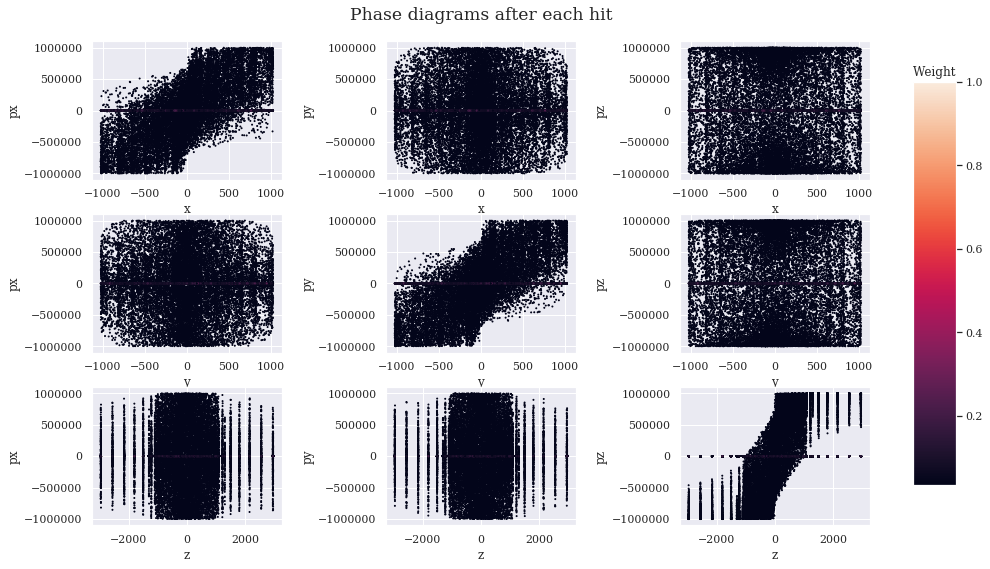

In [38]:
# Obtain the phase diagram of the momentum and the position

fig = plt.figure(figsize=(12,8))
st = fig.suptitle("Phase diagrams after each hit", fontsize="x-large")

plt.subplot(331)
plt.scatter(hct01.tx,hct01.tpx, s=1, c=hct01.weight)
plt.xlabel('x')
plt.ylabel('px')

plt.subplot(332)
plt.scatter(hct01.tx,hct01.tpy, s=1, c=hct01.weight)
plt.xlabel('x')
plt.ylabel('py')

plt.subplot(333)
plt.scatter(hct01.tx,hct01.tpz, s=1, c=hct01.weight)
plt.xlabel('x')
plt.ylabel('pz')

plt.subplot(334)
plt.scatter(hct01.ty,hct01.tpx, s=1, c=hct01.weight)
plt.xlabel('y')
plt.ylabel('px')

plt.subplot(335)
plt.scatter(hct01.ty,hct01.tpy, s=1, c=hct01.weight)
plt.xlabel('y')
plt.ylabel('py')

plt.subplot(336)
plt.scatter(hct01.ty,hct01.tpz, s=1, c=hct01.weight)
plt.xlabel('y')
plt.ylabel('pz')

plt.subplot(337)
plt.scatter(hct01.tz,hct01.tpx, s=1, c=hct01.weight)
plt.xlabel('z')
plt.ylabel('px')

plt.subplot(338)
plt.scatter(hct01.tz,hct01.tpy, s=1, c=hct01.weight)
plt.xlabel('z')
plt.ylabel('py')

plt.subplot(339)
plt.scatter(hct01.tz,hct01.tpz, s=1, c=hct01.weight)
plt.xlabel('z')
plt.ylabel('pz')

cbar_ax = fig.add_axes([1, 0.15, 0.05, 0.7])
fig.colorbar(plt.scatter(hct01.tz,hct01.tpz, s=1, c=hct01.value),cax=cbar_ax)
plt.title('Weight')

plt.subplots_adjust(top=0.92, bottom=0.08, left=0.05, right=0.95, hspace=0.25, wspace=0.55)

plt.show()

We can appreciate that the phase diagram changed, now, there exists certain positions, however the momentum changed, where the analysis is done for each position with their respective momentum coordinate value, we can see that the further away we are from the center, the more momentum it will have, nevertheless there is a hughe variation of this conclusion.
Also, Where there are lines that seem to quantize the position, it is due to the fact that there are not enough detectors to cover those regions. 

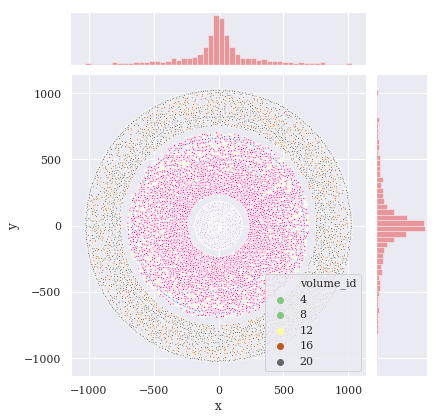

In [39]:
# Visualization of the hit distributions on the  x-y plane, the modules are
# classified by the color
x_y = sns.jointplot(hct01.x,hct01.y, s=.1 )
x_y.ax_joint.cla()
plt.sca(x_y .ax_joint)
sns.scatterplot(hct01.x, hct01.y, hue=hct01.volume_id, s=4, palette='Accent')
plt.show()

Analyzing the positions of the hits, now it is feaseble to see that thye follow a normal distribution. We can appreciate tha the most of hits are done in the first volumes and then they are less likely to occurr in other sections.

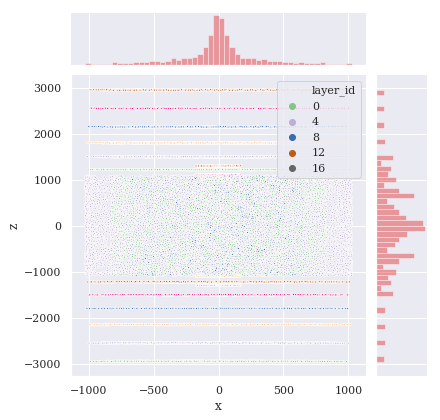

In [40]:
# Visualization of the hit distributions on the  x-z plane, the modules are
# classified by the color
x_z = sns.jointplot(hct01.x,hct01.z, s=.1 )
x_z.ax_joint.cla()
plt.sca(x_z .ax_joint)
sns.scatterplot(hct01.x, hct01.z, hue=hct01.layer_id, s=4, palette='Accent')
plt.show()

The same pattern is seen for the position, in the center there are more particles, and the frecuency starts to decrease upon the distance.

In [ ]:
# Visualization of the hit distributions on the  y-z plane, the modules are
# classified by the color
y_z = sns.jointplot(hct01.y,hct01.z, s=.1 )
y_z.ax_joint.cla()
plt.sca(y_z .ax_joint)
sns.scatterplot(hct01.y, hct01.z, hue=hct01.module_id, s=4, palette='Accent')
plt.show()

This is also seen for the y and z components.

In [ ]:
# Distribution of the magnitude of the position
sns.distplot(hct01.R)
plt.title('Magnitude of Position Distribution')
plt.xlabel('Position [R]')
plt.show()

When obtaining the magnitude of the position, it is possible to see that most of them are concentrated between 0 and 1000. 

In [ ]:
# Distribution of the magnitude of the momentum
sns.distplot(hct01.P, color='Red')
plt.title('Magnitude of Momentum distribution')
plt.xlabel('Momentum [P]')
plt.show()

The momentum distribution is wider,some of them have a low momentum and the others have high. There is not intermediate value, which is interesting. 

In [ ]:
# Barplot of the Volume id's 

sns.countplot(hct01.volume_id)
plt.title('Volume Id')
plt.xlabel('Identification number')
plt.show()

It is worth determining that there are more detectors with the 8th identification, and then the 13th. 

In [ ]:
# Barplot of the Layer id's 
sns.countplot(hct01.layer_id)
plt.title('Layer Id')
plt.xlabel('Identification number')
plt.show()

In [ ]:
# 3D Visualization of the Position
fig = px.scatter_3d(hct01, x='tx', y='ty', z='tz', color = 'R', size_max=.01)
fig.show()

3D visualiaztion of the position of collisions
![3D visualiaztion of the position of collisions](./pictures/image6.png)

There are more detectors in the smaller layers

In [ ]:
# 3D visualization of the Momentum 
fig = px.scatter_3d(hct01, x='tpx', y='tpy', z='tpz', color = 'P', size_max=.01)
fig.show()

3D visualiaztion of the momentum of collisions
![3D visualiaztion of the momentum of collisions](./pictures/image7.png)

In [ ]:
# Error distribution (it is almost null)
sns.violinplot(hct01.error, color='Red')
plt.title('Mean Squared Error distribution')
plt.xlabel('Error')
plt.show()

The error is really low for most of the analysis, there are a few outliers that have a high error rate, nevertheless, this error rate is lower than 1%.

### Trajectories

In [ ]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt

mpl.rcParams['legend.fontsize'] = 10
fig = plt.figure(figsize=(12,8))
st = fig.suptitle("Particle Trajectories", fontsize="x-large")

for i in range(10):
    #Determine the particles with most appearance
    track = hct01[hct01['particle_id']==hct01[hct01['particle_id']!=0]['particle_id'].value_counts().index[i]]
    # plot the path they took
    plt.subplot(2,5,i+1,projection='3d')
    ax = fig.gca(projection='3d')
    ax.plot(track.x, track.y, track.z, marker='o')

    plt.title(f"Particle ID:\n {hct01[hct01['particle_id']!=0]['particle_id'].value_counts().index[i]}")     
ax.legend()
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.05, right=0.95, hspace=0.55, wspace=0.65)
plt.show()

The trajectories of 10 particles can be appreciated in 3D visualization, nevertheless. 

In [ ]:
# Determine some of the particles trajectories in the detector
mpl.rcParams['legend.fontsize'] = 10
fig = plt.figure(figsize=(12,8))
st = fig.suptitle("Particle Trajectories 3D view", fontsize="x-large")

for i in range(10):
    #Determine the particles with most appearance
    track = hct01[hct01['particle_id']==hct01[hct01['particle_id']!=0]['particle_id'].value_counts().index[i]].sort_index()
    # plot the path they took
    ax = fig.gca(projection='3d')
    ax.plot(track.x, track.y, track.z, marker='o')

ax.scatter(detectors.cx, detectors.cy, detectors.cz, s=.1)
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.05, right=0.95, hspace=0.55, wspace=0.65)

plt.show()

This can be all plotted together, within the frame of the detectors

In [ ]:
# Change visualization for more of the particles trajectories in the detector

mpl.rcParams['legend.fontsize'] = 10
fig = plt.figure(figsize=(12,8))
st = fig.suptitle("Particle Trajectories (X-Y plane)", fontsize="x-large")

for i in range(10):
    #Determine the particles with most appearance
    track = hct01[hct01['particle_id']==hct01[hct01['particle_id']!=0]['particle_id'].value_counts().index[i]].sort_index()
    # plot the path they took
    plt.plot(track.x, track.y, marker='o',linewidth=.5)

sns.scatterplot(detectors.cx, detectors.cy, hue=detectors.volume_id, s=5, legend=False)
plt.xlabel('x')
plt.ylabel('y')
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.05, right=0.95, hspace=0.55, wspace=0.65)

plt.show()

Trajectories as seen from above

In [ ]:
# Change visualization for more of the particles trajectories in the detector

mpl.rcParams['legend.fontsize'] = 10
fig = plt.figure(figsize=(12,8))
st = fig.suptitle("Particle Trajectories (X-Y plane)", fontsize="x-large")

for i in range(100):
    #Determine the particles with most appearance
    track = hct01[hct01['particle_id']==hct01[hct01['particle_id']!=0]['particle_id'].value_counts().index[i]].sort_index()
    # plot the path they took
    plt.plot(track.x, track.y, marker='o',linewidth=.5)

sns.scatterplot(detectors.cx, detectors.cy, hue=detectors.volume_id, s=5, legend=False)
plt.xlabel('x')
plt.ylabel('y')
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.05, right=0.95, hspace=0.55, wspace=0.65)

plt.show()

More trajectories as seen from above.